# Panorama Formation using Image Stitching using OpenCV

**Objective**

Given a pair of images like the ones above, we want to stitch them to create a panoramic scene. It is important to note that both images need to share some common region.

Moreover, our solution has to be robust even if the pictures have differences in one or more of the following aspects:

+ Scaling
+ Angle
+ Spacial position
+ Capturing devices

**Panorama stiching algorithm step by step**

Step 1. Detect **keypoints** (DoG, Harris, etc.) and extract **local invariant descriptors** (SIFT, SURF, etc.) from the two input images.

Step 2. **Match the descriptors** between the two images.

Step 3. Use the RANSAC algorithm to **estimate a homography matrix** using our matched feature vectors.

Step 4. Apply a **warping transformation** using the homography matrix obtained from Step #3.

**Another interpretation**

Step 1. Compute the **sift**-key points and descriptors for left and right images.

Step 2. Compute **distances** between every descriptor in one image and every descriptor in the other image.

Step 3. Select the top **best matches** for each descriptor of an image.

Step 4. Run **RANSAC** to estimate homography.

Step 5. Warp to **align** for stitching.

Step 6. Finally **stitch them together**.

In [1]:
#import dependencies 

import matplotlib.pyplot as plt
import numpy as np
import imutils
import cv2

# Local modules
import image_processing as i_p

In [2]:
def read_image(path, is_RGB=0):
    image = cv2.imread(path) 
    if(is_RGB==0):
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

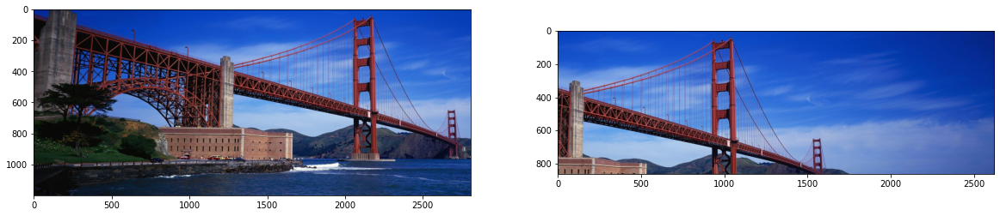

In [3]:
path_1 = 'part_1.jpg'
path_2 = 'part_2.jpg'

image_1 = read_image(path_1, is_RGB=0)
image_2 = read_image(path_2, is_RGB=0)

fig=plt.figure(figsize=(20, 12))

fig.add_subplot(1, 2, 1)
plt.imshow(image_1)

fig.add_subplot(1, 2, 2)
plt.imshow(image_2)
plt.show()

## Edge Detection

In [4]:
def canny_corner(image, weak_threshold=None, strong_threshold=None):
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gauss_image = cv2.GaussianBlur(gray_image, (5, 5), 1.4)
    
    g_x = cv2.Sobel(np.float32(gauss_image), cv2.CV_64F, 1, 0, 3) 
    g_y = cv2.Sobel(np.float32(gauss_image), cv2.CV_64F, 0, 1, 3)
    
    
    # Magnitude and angle of GRADIENT vectors
    mag, ang = cv2.cartToPolar(g_x, g_y, angleInDegrees = True)
    
    mag_init = mag.copy()
    ang_init = ang.copy()
    
    # Looping through every pixel of the grayscale image 
    
    for i_x in range(gauss_image.shape[1]):
        for i_y in range(gauss_image.shape[0]):          
            grad_angle = ang[i_y][i_x]
            if(grad_angle > 180):
                grad_angle = abs(grad_angle-180)
                
            # selecting the neighbours of the target pixel according to the gradient direction
            
            # In the x axis direction 
            if grad_angle <= 22.5: 
                neighb_1_x, neighb_1_y = i_x-1, i_y 
                neighb_2_x, neighb_2_y = i_x + 1, i_y 
              
            # top right (diagnol-1) direction 
            elif grad_angle > 22.5 and grad_angle <= (22.5 + 45): 
                neighb_1_x, neighb_1_y = i_x-1, i_y-1
                neighb_2_x, neighb_2_y = i_x + 1, i_y + 1
              
            # In y-axis direction 
            elif grad_angle > (22.5 + 45) and grad_angle <= (22.5 + 90): 
                neighb_1_x, neighb_1_y = i_x, i_y-1
                neighb_2_x, neighb_2_y = i_x, i_y + 1
              
            # top left (diagnol-2) direction 
            elif grad_angle > (22.5 + 90) and grad_angle <= (22.5 + 135): 
                neighb_1_x, neighb_1_y = i_x-1, i_y + 1
                neighb_2_x, neighb_2_y = i_x + 1, i_y-1
              
            # Now it restarts the cycle 
            elif grad_angle > (22.5 + 135) and grad_angle <= (22.5 + 180): 
                neighb_1_x, neighb_1_y = i_x-1, i_y 
                neighb_2_x, neighb_2_y = i_x + 1, i_y 
               
            # Non-maximum suppression step 
            if gauss_image.shape[1] > neighb_1_x >= 0 and gauss_image.shape[0] > neighb_1_y >= 0: 
                if mag[i_y, i_x] < mag[neighb_1_y, neighb_1_x]: 
                    mag[i_y, i_x] = 0
                    continue
   
            if gauss_image.shape[1] > neighb_2_x >= 0 and gauss_image.shape[0] > neighb_2_y >= 0: 
                if mag[i_y, i_x]<mag[neighb_2_y, neighb_2_x]: 
                    mag[i_y, i_x]= 0
            
    ids = np.zeros_like(gauss_image)
    weak_ids = np.zeros_like(gauss_image)
    strong_ids = np.zeros_like(gauss_image)  
            
    for i_x in range(gauss_image.shape[1]): 
        for i_y in range(gauss_image.shape[0]): 
              
            grad_mag = mag[i_y][i_x] 
              
            if grad_mag < weak_threshold: 
                mag[i_y, i_x]= 0
            elif strong_threshold > grad_mag >= weak_threshold: 
                ids[i_y, i_x]= 1
            else: 
                ids[i_y, i_x]= 2
            
    return gauss_image, mag_init, ang_init

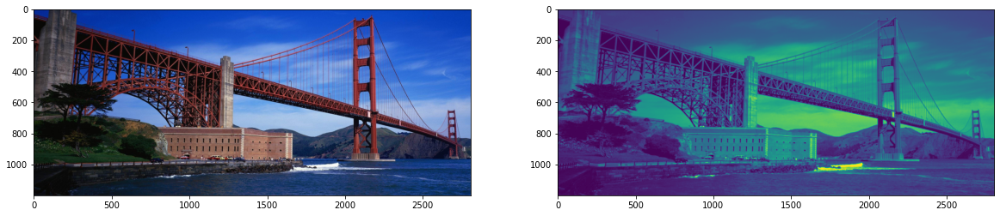

In [5]:
canny_image, mag_init, ang_init = canny_corner(image_1, weak_threshold=20, strong_threshold=100)

fig = plt.figure(figsize=(20, 12))

fig.add_subplot(1, 2, 1)
plt.imshow(image_1)

fig.add_subplot(1, 2, 2)
plt.imshow(canny_image)
plt.show()

## Keypoint Detection
An initial and probably naive approach would be to extract key points using an algorithm such as **Harris Corners**. Then, we could try to match the corresponding key points based on some measure of similarity like Euclidean distance. As we know, corners have one nice property: they are **invariant to rotation**.


*Algorithm*


Step 1: Take the grayscale of the original image

Step 2: Apply a **Gaussian filter** to smooth out any noise

Step 3: Apply **Sobel operator** (gradient calculation) to find the x and y gradient values for every pixel in the grayscale image

Step 4: For each pixel p in the grayscale image, consider a 3×3 window around it and compute the corner strength function. Call this its Harris value.

Step 5: Find all pixels that exceed a certain threshold and are the local maxima within a certain window (to prevent redundant dupes of features)

Step 6: For each pixel that meets the criteria in 5, compute a feature descriptor.

In [6]:
def harris_corners(image, threshold=0.005):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray = np.float32(gray)
    
    # Detect corners 
    dst = cv2.cornerHarris(gray, 2, 3, 0.04)

    # Dilate corner image to enhance corner points
    dst = cv2.dilate(dst,None)
    
    # Extract and display only strong corner
    thresh = threshold*dst.max()
    
    clone_img = image.copy()
    
    for j in range(0, dst.shape[0]):
        for i in range(0, dst.shape[1]):
            if(dst[j,i] > thresh):
                # image, center pt, radius, color, thickness
                cv2.circle(clone_img, (i, j), 1, (0,255,0), 1)

    # plt.imshow(clone_img)
    return clone_img

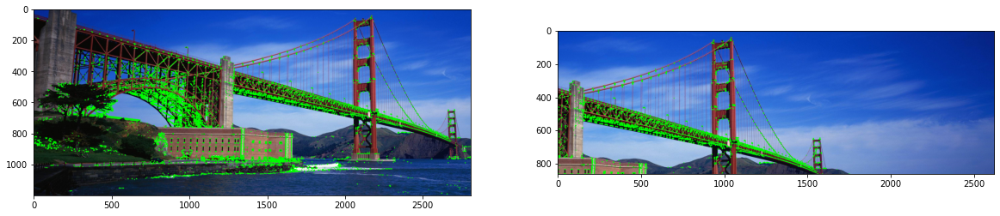

In [7]:
# Harris corner detector.
res1 = harris_corners(image_1, threshold=0.005)
res2 = harris_corners(image_2, threshold=0.005)

fig=plt.figure(figsize=(20, 12))

fig.add_subplot(1, 2, 1)
plt.imshow(res1)

fig.add_subplot(1, 2, 2)
plt.imshow(res2)
plt.show()

## Descriptors and Matching
**Method: SIFT**


*Major advantages of SIFT are*

**Locality:** features are local, so robust to occlusion and clutter (no prior segmentation).

**Distinctiveness:** individual features can be matched to a large database of objects.

**Quantity:** many features can be generated for even small objects.

**Efficiency:** close to real-time performance.

**Extensibility:** can easily be extended to a wide range of different feature types, with each adding robustness.


*Algorithm*

Step 1: **Scale-space peak selection:** Potential location for finding features.

Step 2: **Keypoint Localization:** Accurately locating the feature keypoints.

Step 3: **Orientation Assignment:** Assigning orientation to keypoints.

Step 4: **Keypoint descriptor:** Describing the keypoints as a high dimensional vector.

Step 5: **Keypoint Matching**

In [8]:
list_methods = ['sift', 'brisk', 'orb']
list_kps = []

sift_kps_1 = []
sift_kps_2 = []

sift_ftrs_1 = []
sift_ftrs_2 = []

def keypoints_descriptor(path):
    list_methods = ['sift', 'brisk', 'orb']
    list_kps = []
    sift_kps = []
    sift_ftrs = []
    
    image = read_image(path, is_RGB=0)
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    for method in list_methods:
        kps, ftrs = i_p.featureDescriptors(image, method)       
        draw_kps = cv2.drawKeypoints(image, kps, gray_image, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        list_kps.append(draw_kps)
        
        if method == 'sift':
            sift_kps = kps
            sift_ftrs = ftrs
            
    return list_kps, sift_kps, sift_ftrs

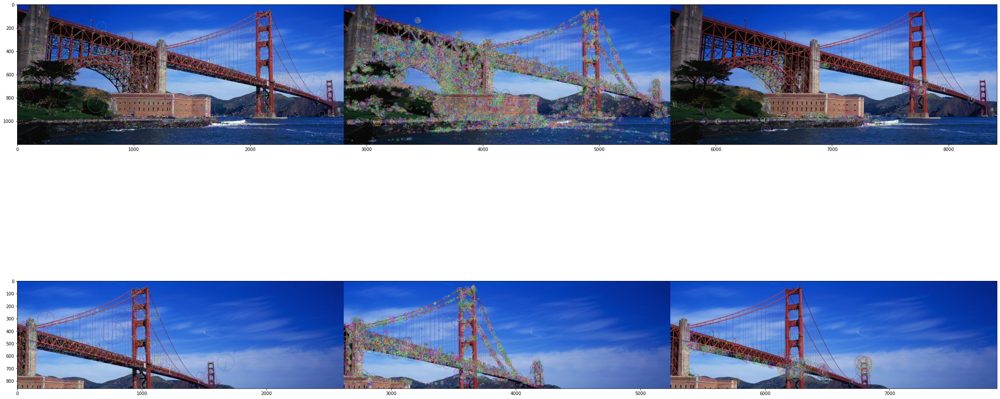

In [9]:
list_kps_1, sift_kps_1, sift_ftrs_1 = keypoints_descriptor(path_1)
list_kps_2, sift_kps_2, sift_ftrs_2 = keypoints_descriptor(path_2)

fig = plt.figure(figsize=(40, 20))

fig.add_subplot(2, 1, 1)
plt.imshow(i_p.stack_image(1, list_kps_1))

fig.add_subplot(2, 1, 2)
plt.imshow(i_p.stack_image(1, list_kps_2))

plt.show()

In [10]:
print('Number of SIFT keypoint of Image A: ',len(sift_kps_1))
print('Number of SIFT keypoint of Image B: ',len(sift_kps_2))

print('Dimension of "SIFT" descriptor vector (also known as feature): ',len(sift_ftrs_1[1]))

Number of SIFT keypoint of Image A:  14181
Number of SIFT keypoint of Image B:  4622
Dimension of "SIFT" descriptor vector (also known as feature):  128


### Keypoint matching by BFMatcher (Brute-force matcher)

In [11]:
def bf_matching(threshold):
    
    match = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)
    matches = match.knnMatch(np.asarray(sift_ftrs_1 ,np.float32), np.asarray(sift_ftrs_2, np.float32), k=2)
    
    thresh = []
    for m,n in matches:
        if m.distance < threshold*n.distance:
            thresh.append(m)
    
    result = cv2.drawMatches(image_1, sift_kps_1, image_2, sift_kps_2, thresh, None, flags = 2)
    
    plt.rcParams['figure.figsize'] = [24, 12]
    plt.title('Best Matching Points')
    plt.imshow(result)
    plt.show()
    
    print("\nNumber of Matching Keypoints Between 2 Images: ", len(matches))

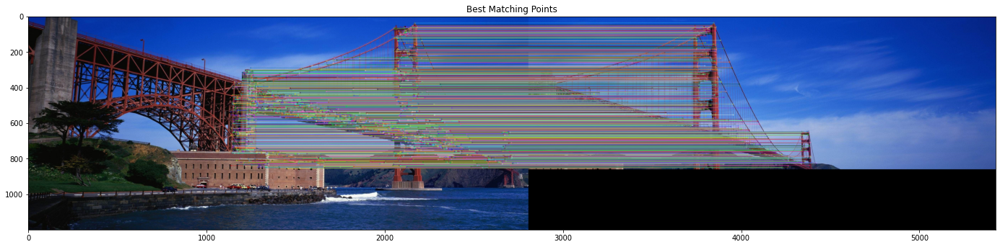


Number of Matching Keypoints Between 2 Images:  14181


In [12]:
bf_matching(threshold=0.2)

### Keypoint matching by FLANN 

In [13]:
def flann_matching(threshold):
   
    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 10)
    search_params = dict(checks = 50)
    
    match = cv2.FlannBasedMatcher(index_params, search_params)
    matches = match.knnMatch(sift_ftrs_1, sift_ftrs_2, k=2)
    
    thresh = []
    for m,n in matches:
        if m.distance < threshold*n.distance:
            thresh.append(m)
            
    draw_params = dict(matchColor = (0, 100, 125), 
                   singlePointColor = None,
                   flags = 2)
    
    result = cv2.drawMatches(image_1, sift_kps_1, image_2, sift_kps_2, thresh, None, **draw_params)
    plt.imshow(result)
    
    return thresh

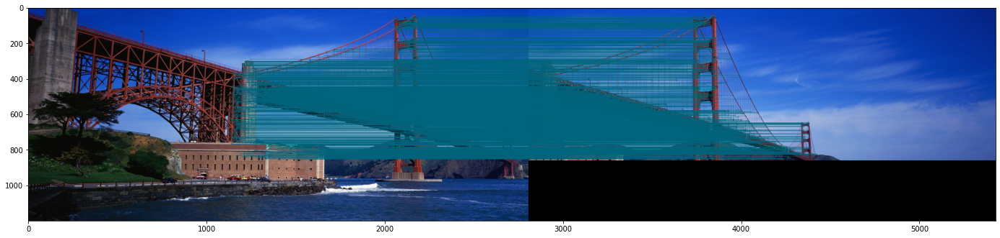

In [14]:
thresh = flann_matching(threshold=0.2)

## Wrapping and stiching

So, once we have obtained best matches between the images, our next step is to calculate the homography matrix. As we described before, the homography matrix will be used with best matching points, to estimate a relative orientation transformation within the two images.

To estimate the homography in OpenCV is a simple task, it’s a one line of code:

In [15]:
def stitching(image_2):
    MIN_MATCH_COUNT = 10
    
    if len(thresh) > MIN_MATCH_COUNT:
        src_pts = np.float32([sift_kps_1[m.queryIdx].pt for m in thresh]).reshape(-1,1,2)
        dst_pts = np.float32([sift_kps_2[m.trainIdx].pt for m in thresh]).reshape(-1,1,2)
    
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)    
        h, w = image_1.shape[:-1]
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts, M)
        
        image_2 = cv2.polylines(image_2,[np.int32(dst)],True,255,3, cv2.LINE_AA)
        plt.imshow(image_2)
    else:
        print ("Not enough matches are found - %d/%d" % (len(good),MIN_MATCH_COUNT))

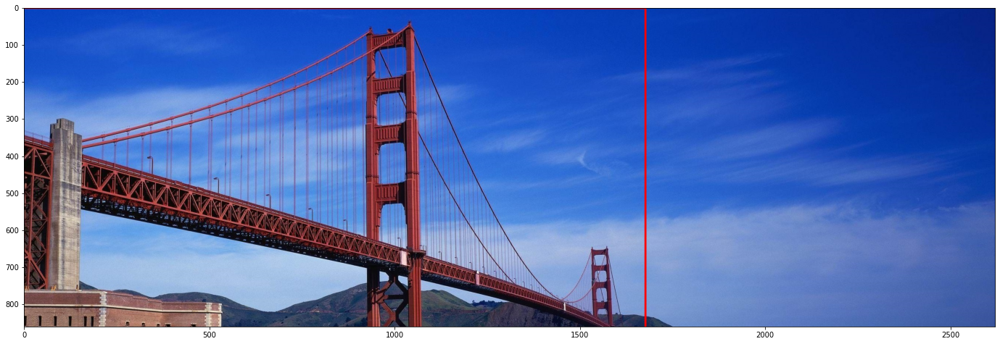

In [16]:
stitching(image_2)

In [17]:
def panorama_result():
    src_pts = np.float32([sift_kps_1[m.queryIdx].pt for m in thresh]).reshape(-1,1,2)
    dst_pts = np.float32([sift_kps_2[m.trainIdx].pt for m in thresh]).reshape(-1,1,2)
    
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)    

    dst = cv2.warpPerspective(image_1 ,M ,(image_1.shape[1] + image_2.shape[1], image_1.shape[0]))

    dst[0:image_1.shape[0], 0:image_1.shape[1]] = image_1
    
    return dst

In [18]:
def trim(frame):
    #crop top
    if not np.sum(frame[0]):
        return trim(frame[1:])
    #crop bottom
    elif not np.sum(frame[-1]):
        return trim(frame[:-2])
    #crop left
    elif not np.sum(frame[:,0]):
        return trim(frame[:,1:]) 
    #crop right
    elif not np.sum(frame[:,-1]):
        return trim(frame[:,:-2])    
    return frame

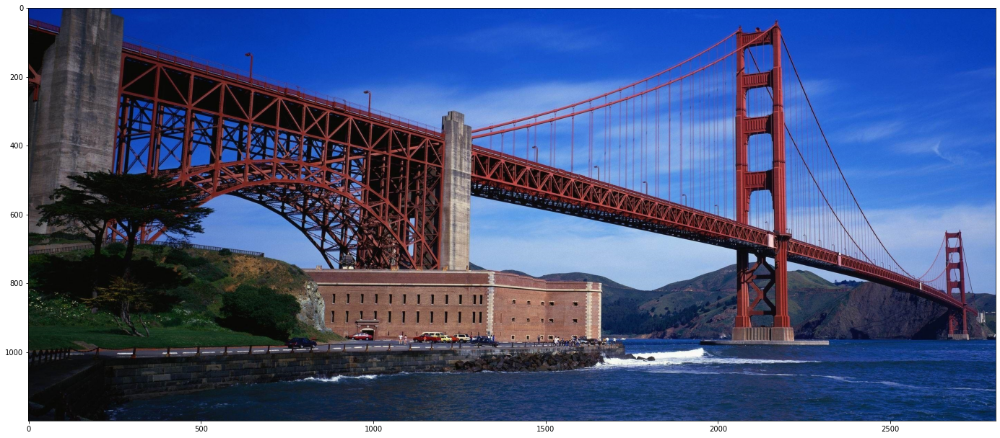

In [19]:
wrapped = panorama_result()
plt.imshow(trim(wrapped))

# Image segmentation

## K-means clustering algorithm

K Means is a clustering algorithm. Clustering algorithms are unsupervised algorithms which means that there is no labelled data available. It is used to identify different classes or clusters in the given data based on how similar the data is. Data points in the same group are more similar to other data points in that same group than those in other groups. 

K-means clustering is one of the most commonly used clustering algorithms. Here, k represents the number of clusters.

**Steps of K-means's work**

Step 1. Choose the number of clusters you want to find which is $k$.

Step 2. Randomly assign the data points to any of the $k$ clusters.

Step 3. Then calculate the center of the clusters.

Step 4. Calculate the distance of the data points from the centers of each of the clusters.

Step 5. Depending on the distance of each data point from the cluster, reassign the data points to the nearest clusters.

Step 6. Again calculate the new cluster center.

Step 7. Repeat steps 4,5 and 6 till data points don’t change the clusters, or till we reach the assigned number of iterations.

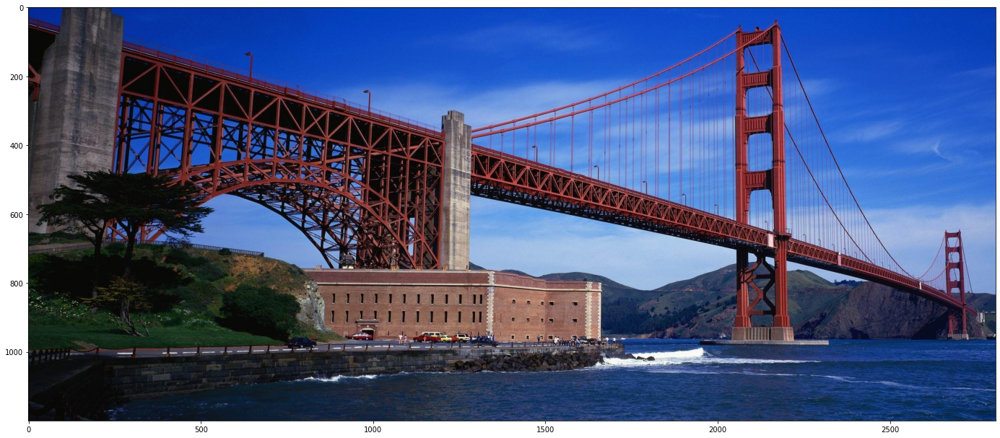

In [20]:
path = 'part_1.jpg'
image = read_image(path, is_RGB=0)

plt.imshow(image)

### Preprocessing
Reshape image into 2 Dimension for applying K-means, then transform in to numpy tensor of float.

In [21]:
gray_image = np.float32(image.reshape((-1,3)))

The K-means algorthim does not help us to find the optimize result. The below line of code defines the criteria for the algorithm to stop running, which will happen is 100 iterations are run or the epsilon (which is the required accuracy) becomes 85% 

In [22]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.85) 

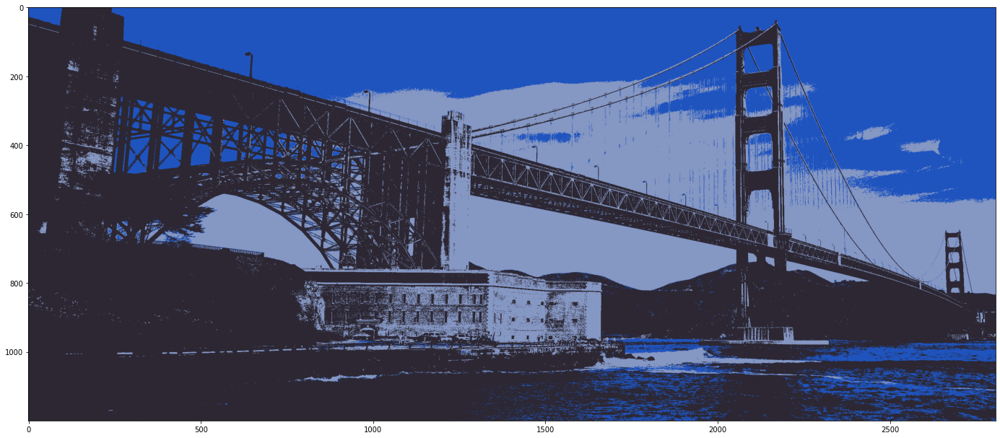

In [23]:
# Set k = 3
k = 3
retval, labels, centers = cv2.kmeans(gray_image, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS) 
  
# convert data into 8-bit values 
centers = np.uint8(centers) 
segmented_data = centers[labels.flatten()] 
  
# reshape data into the original image dimensions 
segmented_image = segmented_data.reshape((image.shape)) 
  
plt.imshow(segmented_image)

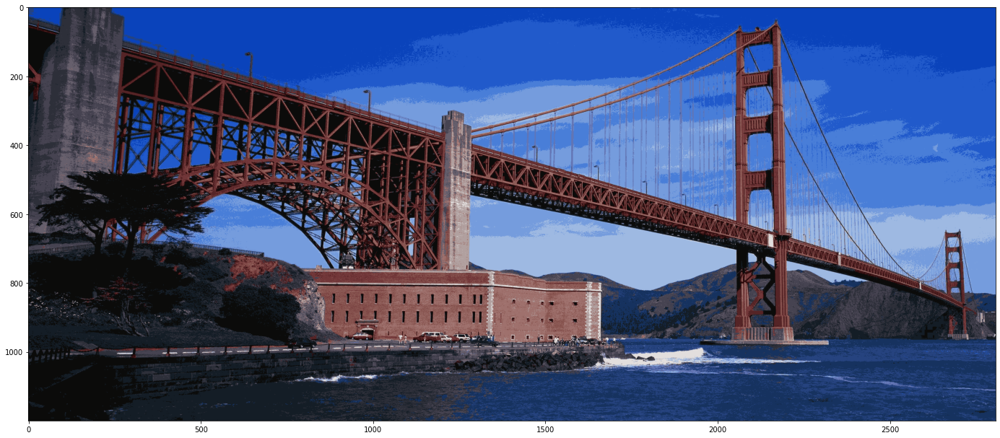

In [24]:
# Set k = 20
k = 20
retval, labels, centers = cv2.kmeans(gray_image, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS) 
  
# convert data into 8-bit values 
centers = np.uint8(centers) 
segmented_data = centers[labels.flatten()] 
  
# reshape data into the original image dimensions 
segmented_image = segmented_data.reshape((image.shape)) 
  
plt.imshow(segmented_image)

As you can see with an increase in the value of $k$, the image becomes clearer and distinct because the K-means algorithm can classify more classes/cluster of colors. K-means clustering works well when we have a small dataset. It can segment objects in images and also give better results. But when it is applied on large datasets (more number of images), it looks at all the samples in one iteration which leads to a lot of time being taken up. 

## Graph cut

One of the most challenging thing about this project is how to transform an image into a graph. Graph cuts and efficient N-D image segmentation by Boykov and Funka-Lea, the authors described in great detail how to define a graph based on an image. Our implementation closely follows their idea of constructing the graph. For simplicities, we will use grayscale square images. Although the same idea could be easily extended for color images with a suitable inter-pixel similarity measurement. The images are only squared for the sake of convenience.

To begin with, a pixel in the image is a vertex in the graph labeled in row-major order. These vertices are called pixel vertices. In addition, there are two extra vertices that serve as the source and the sink.

There are two types of edges in our graph. The first type is called $n$-links, which connects neighboring pixel vertices in a 4-neighboring system. The second type of edges is called $t$-links. These links connect the source or sink vertex with the pixel vertices.

The $n$-link edges must have weights carefully computed in order to reflect inter-pixel similarities. Concretely, we want the weight of an edge to be big with the two pixels are similar, and small when they are quite different. One idea is to let the weight be boundary penalty, a function that maps two pixel intensities to a positive integer. Let $I_p$
 be the brightness, or intensity, of the pixel vertex $p$. For any edge $(p,q)\in E$, the boundary penalty $B(I_p, I_q)$ is defined to be:
 $$ B(I_p, I_q) = 100\cdot \exp\Bigg(\frac{-(I_p-I_q)^2}{2\sigma ^2}\Bigg) $$
 
This choice of function is determined by a series of trial and error. It penalizes a lot when $|I_p-I_q|<\sigma$ and is quite negligible if $|I_p-I_q|>\sigma$, From empirical results, we choose $\sigma=30$. Finally, the result is multiplied by 100 and cast to an integer. This is because network flow models require that the capacities be discrete rather than continuous.

To help with making $t$-links, the user is prompted to highlight at least one pixel vertex as a background pixel and at least one as a foreground pixel. These pixel vertices are called seeds. For every background seed, an edge is added from the source to the background seed with capacity $\mathcal{K}$ defined as follows.

$$\mathcal {K} = \max(\{B(I_p, I_q)|(p, q)\in E\})$$

n a similar fashion, edges to the sink are added for every foreground seeds ith capacity $\mathcal{K}$.

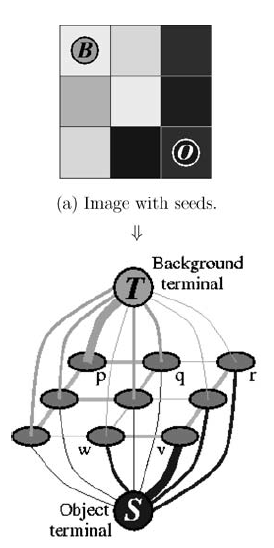

<center>An example network defined on a simple 3x3 image with a background seed and a foreground seed (Boykov and Funka-Lea, 2006).<center>
    
<br/>

As these seeds share an edge with the source or sink, they are hard-coded to be either the foreground or the background.
Now with the graph full defined, we can run a graph cut algorithm to find the minimum cut.

## Algorithm

There are several algorithms for finding the maximum flow. This project explores the efficiency of Edmonds-Karp algorithm and push-relabel algorithm. These are very standard, straightforward algorithms, but are often slow in practice.

### Edmonds-Karp Algorithm

The Edmonds-Karp algorithm is an implementation of the Ford-Fulkerson method. First, we define a residual network $G_f=(V,E_f)$ to be the same network but with capacity $c_f(u,v)=c(u,v)-f(u,v)$ and no flow. The idea behind the Ford-Fulkerson method is that if there exists a path from $s$ to $t$ in the residual network, then we can augment the current flow by this path. This path is called the augmenting path. The augmentation of this path is equal to the smallest residual capacity along this path. Once no augmenting path can be found, the current flow must be the max-flow.

```
while there is a path from s to t in the residual network:
    flow = min([residual capacity of every edge along this path]) 
    for every edge (u,v) in this path:
        residual capacity of (u,v) -= flow
        residual capacity of (v,u) += flow
```

### Push Relabel Algorithm

In the Push Relabel algorithm, we maintain a "preflow", which is a flow sent through the network but does not necessarily satisfy the flow conservation. In a preflow, the flow entering a vertex can be more than the flow exiting the vertex. Given a preflow, a vertex can have an excess flow equal to the difference between the flow entering the vertex and the flow exiting the vertex. A vertex with excess flow is called an overflowing vertex.

In addition, we augment each vertex with a height attribute. Let $h(u)$ denote the height of a vertex u. The heights determine how a flow can be pushed. We can only push a flow from a higher vertex to a lower vertex, and not the other way around.

We start off by saturating all outgoing edges from $s$. This gives a valid preflow. We also set the height of $s$ to be the number of vertices, and all other heights 0. The algorithm centers around two main operations: push and relabel. For a given vertex $u$, we can push it by finding an outgoing edge from $u$ that is not saturated. The push to this edge is equal to the minimum of the residual capacity of the edge and the excess flow of $u$. Once the flow is pushed, the excess flow at 
$u$ falls by the amount of the pushed flow, and the excess flow at $v$ increases by the same amount. Not all edges can be pushed, however. In that case, we will relabel $u$ by setting the height of $u$ to be
$$ h(u)=1+\min\{h(v)|(u,v)\in E_f\} $$
```
while there exists an overflowing vertex u:
    push(u) or relabel(u)
```